In [42]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("../")
from test_to_bw_fast import read_model, get_config
import tfr_evaluate
import tensorflow as tf
import embed
import util
import numpy as np
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from matplotlib.ticker import MaxNLocator

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
testset, targets = tfr_evaluate.collect_whole_testset(coords=True)

In [3]:
np_C, np_X, np_Y = util.convert_tfr_to_np(testset, 3)

In [4]:
# load and get model layer
run_path = '../'+'paper_runs/new_models/32_res/run-20211023_095131-w6okxt01'

layer = -3
model, bin_size = read_model(run_path, compile_model=False)
aux_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[layer].output)
    

In [5]:
aux_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequence (InputLayer)           [(None, 2048, 4)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 2048, 256)    19712       sequence[0][0]                   
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 2048, 256)    1024        conv1d[0][0]                     
__________________________________________________________________________________________________
filter_activation (Activation)  (None, 2048, 256)    0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [6]:
threshold = 2
cell_line = 13
print(targets[cell_line])
thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_np(np_C, 
                                                                           np_X, 
                                                                           np_Y, 
                                                                           cell_line, 
                                                                           more_than=threshold)
idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
interm_representations = embed.predict_np(thresholded_X, aux_model, batch_size=32, reshape_to_2D=True)

thresholded_Y.shape

PC-3


(23346, 2048)

In [7]:
embeddings = embed.get_embeddings(interm_representations)
embeddings['IDR'] = idr_class
embeddings['cell line'] = targets[cell_line]

In [11]:
embeddings.to_csv('../paper_tables/UMAP_embeddings.csv', index=None)

In [15]:
# slice different parts of the seamonster
colorblind_pallete = ["#000000","#004949","#009292","#ffb6db", #"#ff6db6",
                     "#490092","#006ddb","#b66dff","#6db6ff","#b6dbff",
                     "#920000","#924900","#db6d00","#24ff24","#ffff6d"]

conditions = {'left IDR': embed.select(embeddings, upper_lim_1=-1, lower_lim_2=5, idr='y'),
              'right IDR': embed.select(embeddings, lower_lim_1=4, upper_lim_2=6, idr='y'),
              'top IDR': embed.select(embeddings, lower_lim_1=3, lower_lim_2=11, idr='y'),
              'center IDR': embed.select(embeddings, lower_lim_1=1, 
                                   upper_lim_1=3, lower_lim_2=5, upper_lim_2=8, idr='y')
             }

# add splice labels
labels = np.array(['IDR' if e else 'non-IDR' for e in embeddings['IDR'].values])
labels = labels.astype('U25')
color_correspondance = {'non-IDR':'#B2BABB', 
                        'IDR':'#FF5733'}
for i, (l, c) in enumerate(conditions.items()):
    print(l)
    labels[c] = l
    color_correspondance[l] = colorblind_pallete[i+1]
embeddings['labels'] = labels

Choosing only IDR
Choosing only IDR
Choosing only IDR
Choosing only IDR
left IDR
right IDR
top IDR
center IDR


In [26]:
util.make_dir('../paper_figures/seamonster')

'../paper_figures/seamonster'

In [52]:
color_correspondance

{'non-IDR': '#B2BABB',
 'IDR': '#FF5733',
 'left IDR': '#004949',
 'right IDR': '#009292',
 'top IDR': '#ffb6db',
 'center IDR': '#490092'}

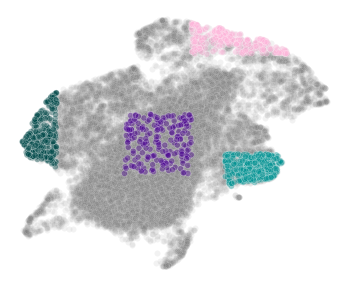

In [49]:
fig, ax = plt.subplots(1,figsize=[6,5])

sns.scatterplot(data=embeddings,
               x='UMAP 1', y='UMAP 2',
               alpha=0.1, 
               color='grey',
               ax=ax)
df = embeddings.sort_values('labels')
df = df[(df['labels']!='IDR')&(df['labels']!='non-IDR')]
df.to_csv('../paper_figures/seamonster/df_labelled_emb.csv', index=None)
sns.scatterplot(data=df,
               x='UMAP 1', y='UMAP 2',
               hue='labels', alpha=0.4, 
               palette=color_correspondance,
               ax=ax)
ax.get_legend().remove()
ax.set_axis_off()
plt.savefig('../paper_figures/seamonster_cl13.svg')

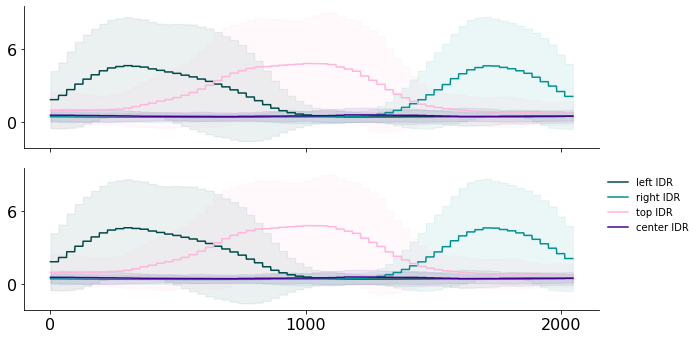

In [53]:
fig, axs = plt.subplots(2,1,figsize=[10,5], sharex=True)
data_and_labels_true = [(thresholded_Y[c], l, color_correspondance[l]) for l, c in conditions.items()]
embed.plot_mean_coverages(data_and_labels, axs[0])

data_and_labels_pred = [(np.repeat(predictions[:,:,cell_line][c], bin_size, axis=1), l, color_correspondance[l]) for l, c in conditions.items()]
embed.plot_mean_coverages(data_and_labels, axs[1])
for i, title in enumerate(["Mean coverage experimental", 'Mean coverage predicted']):    
#     axs[i].set_ylim(0, ax.get_ylim()[1]+2)
    axs[i].yaxis.set_major_locator(MaxNLocator(2))
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
#     axs[i].set_title(title)
    
# axs[0].get_legend().remove()
axs[1].legend(loc='upper left', bbox_to_anchor=(1,1), 
                  prop={'size': 10}, frameon=False)
axs[1].set_xticks([0, 1000, 2000]) 
plt.tight_layout()
plt.savefig('../paper_figures/seamonster_distr.svg')

In [54]:
with open("../paper_figures/seamonster/data_and_labels", "wb") as fp:   #Pickling
    pickle.dump([data_and_labels_true, data_and_labels_pred], fp)

In [60]:
import os
import explain

In [56]:
saliency_cell_line_dir = '../paper_figures/seamonster/'+targets[cell_line]
util.make_dir(saliency_cell_line_dir)

'../paper_figures/seamonster/PC-3'

../paper_figures/seamonster/PC-3/left IDR.svg
../paper_figures/seamonster/PC-3/right IDR.svg
../paper_figures/seamonster/PC-3/top IDR.svg
../paper_figures/seamonster/PC-3/center IDR.svg


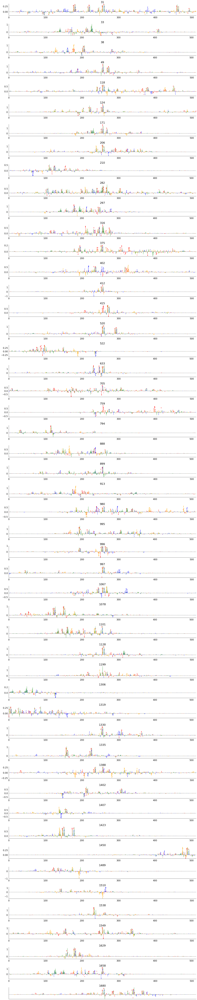

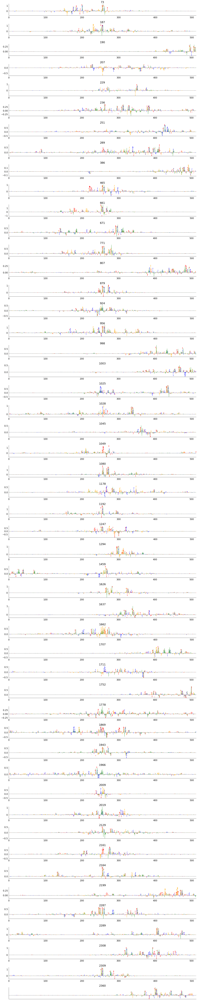

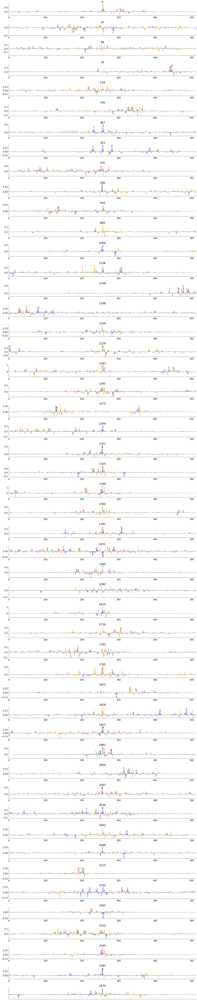

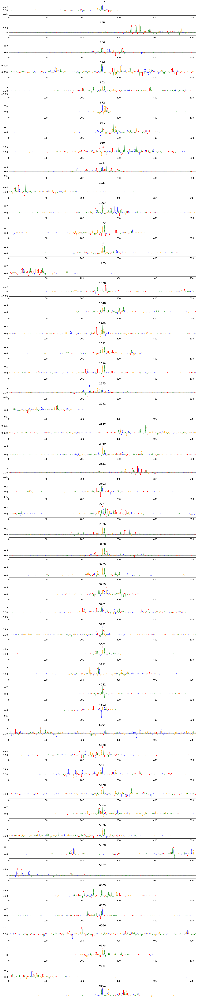

In [61]:
sets_of_ids = {k:np.argwhere(v).flatten()[:50] for k, v  in conditions.items()}

for label,selected_sample_ids in sets_of_ids.items():
    output_path = os.path.join(saliency_cell_line_dir, label+'.svg')
    print(output_path)
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = thresholded_X[selected_sample_ids]
    saliency_scores = explainer.saliency_maps(X_sample)
    explain.plot_saliency_logos_oneplot(saliency_scores, X_sample, window=256, 
                                    titles = selected_sample_ids,
                                    filename=output_path)

../paper_figures/seamonster/PC-3/center IDR_example_selection.svg
../paper_figures/seamonster/PC-3/left IDR_example_selection.svg


AssertionError: File exists!

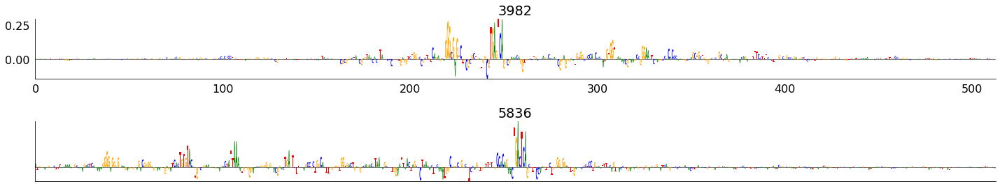

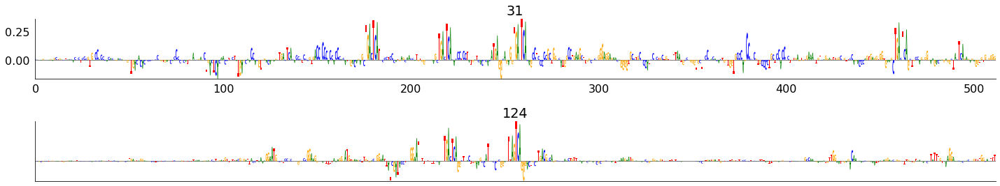

In [71]:
sets_of_ids = {'center IDR':[3982, 5836], 'left IDR':[31, 124], 'right IDR': [671, 879], 'top IDR': [1106, 1226]}
sets_of_ids
for label,selected_sample_ids in sets_of_ids.items():
    output_path = os.path.join(saliency_cell_line_dir, label+'_example_selection.svg')
    print(output_path)
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = thresholded_X[selected_sample_ids]
    saliency_scores = explainer.saliency_maps(X_sample)
    explain.plot_saliency_logos_oneplot(saliency_scores, X_sample, window=256, 
                                    titles = selected_sample_ids,
                                    filename=output_path)

In [62]:
conditions

{'left IDR': array([False, False, False, ..., False, False, False]),
 'right IDR': array([False, False, False, ..., False, False, False]),
 'top IDR': array([ True, False, False, ..., False, False, False]),
 'center IDR': array([False, False, False, ..., False, False, False])}

# Panc1 seamonster coverage

In [36]:
colorblind_pallete = ["#000000","#004949","#009292","#ffb6db", #"#ff6db6",
                     "#490092","#006ddb","#b66dff","#6db6ff","#b6dbff",
                     "#920000","#924900","#db6d00","#24ff24","#ffff6d"]

conditions = {'left IDR': embed.select(embeddings,lower_lim_1=None, upper_lim_1=2, 
                                       lower_lim_2=1, upper_lim_2=5, idr='y'),
              'right IDR': embed.select(embeddings, lower_lim_1=6.5, upper_lim_1=None, 
                                        lower_lim_2=1, upper_lim_2=5, idr='y'),
              'top IDR': embed.select(embeddings, lower_lim_1=4, upper_lim_1=6,
                                      lower_lim_2=7, upper_lim_2=None, idr='y'),
              'mid blob IDR': embed.select(embeddings, lower_lim_1=3, upper_lim_1=6,
                                      lower_lim_2=0.1, upper_lim_2=4, idr='y')
#               'center IDR': embed.select(embeddings, lower_lim_1=1, 
#                                    upper_lim_1=3, lower_lim_2=5, upper_lim_2=8, idr='y')
             }

# add splice labels
labels = np.array(['IDR' if e else 'non-IDR' for e in embeddings['IDR'].values])
labels = labels.astype('U25')
color_correspondance = {'non-IDR':'#B2BABB', 
                        'IDR':'#FF5733'}
for i, (l, c) in enumerate(conditions.items()):
    print(l, np.sum(c))
    labels[c] = l
    color_correspondance[l] = colorblind_pallete[i+1]
embeddings['labels'] = labels

Choosing only IDR
Choosing only IDR
Choosing only IDR
Choosing only IDR
left IDR 125
right IDR 71
top IDR 127
mid blob IDR 30


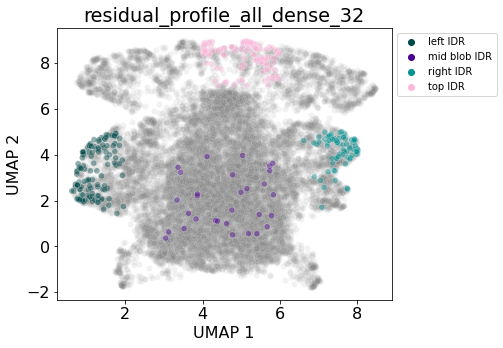

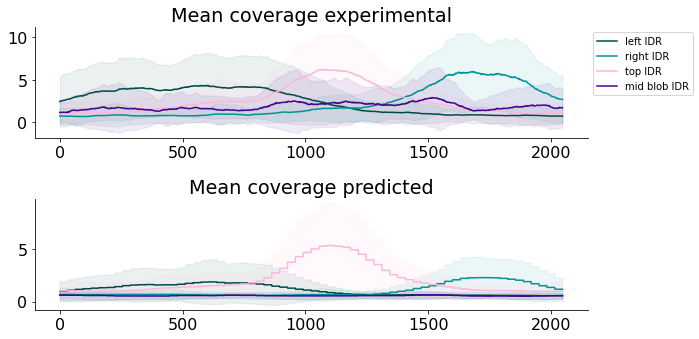

In [39]:
# plot seamosnter with slices and avg coverage
font = {'size': 16}
matplotlib.rc('font', **font)
fig, ax = plt.subplots(1,figsize=[6,5])

sns.scatterplot(data=embeddings,
               x='UMAP 1', y='UMAP 2',
               alpha=0.1, 
               color='grey',
               ax=ax)
df = embeddings.sort_values('labels')
df = df[(df['labels']!='IDR')&(df['labels']!='non-IDR')]
sns.scatterplot(data=df,
               x='UMAP 1', y='UMAP 2',
               hue='labels', alpha=0.4, 
               palette=color_correspondance,
               ax=ax)

ax.legend(loc='upper left', bbox_to_anchor=(1,1), 
               prop={'size': 10})
ax.set_title(embed.describe_run(run_path).split(' ')[1])
# plt.style.use('seaborn-white')
fig, axs = plt.subplots(2,1,figsize=[10,5])
data_and_labels = [(thresholded_Y[c], l, color_correspondance[l]) for l, c in conditions.items()]
embed.plot_mean_coverages(data_and_labels, axs[0])

data_and_labels = [(np.repeat(predictions[:,:,cell_line][c], bin_size, axis=1), l, color_correspondance[l]) for l, c in conditions.items()]
embed.plot_mean_coverages(data_and_labels, axs[1])
for i, title in enumerate(["Mean coverage experimental", 'Mean coverage predicted']):    
#     axs[i].set_ylim(0, ax.get_ylim()[1]+2)
    if i == 0:
        axs[i].legend(loc='upper left', bbox_to_anchor=(1,1), 
                      prop={'size': 10})
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].set_title(title)

plt.tight_layout()

In [40]:
np_C, np_X, np_Y = util.convert_tfr_to_np(testset, 3)

In [15]:
# load and threshold data
all_emb = []
# testset, targets = tfr_evaluate.collect_whole_testset(coords=True)
threshold = 2
for cell_line in tqdm(range(15)):
    thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_np(np_C, np_X, np_Y, cell_line, more_than=threshold)
    idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
    predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
    thresholded_Y.shape
    interm_representations = embed.predict_np(thresholded_X, aux_model, batch_size=32, reshape_to_2D=True)
    embeddings = embed.get_embeddings(interm_representations)
    embeddings['IDR'] = idr_class
    embeddings['cell line'] = targets[cell_line]
    all_emb.append(embeddings)



100%|██████████| 15/15 [2:12:13<00:00, 528.89s/it] 


In [ ]:
df = pd.concat(all_emb)
fig = plt.figure(figsize=[20,10])
nrows, ncols = 3, 5
for i, df in enumerate(all_emb):
    ax = fig.add_subplot(nrows, ncols, i+1)
    sns.scatterplot(data=df, x='UMAP 1', y='UMAP 2', hue='IDR', ax=ax, alpha=0.1)
    ax.set_title(targets[i])

plt.suptitle('run-20211023_095131-w6okxt01')
plt.tight_layout()

In [61]:
# df.to_csv('embeddings_all_cells_run-20211023_095131-w6okxt01.csv', index=None)

# Specific cell line embeddings

In [179]:
threshold = 2
cell_line = 13
print(targets[cell_line])
thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_np(np_C, 
                                                                           np_X, 
                                                                           np_Y, 
                                                                           cell_line, 
                                                                           more_than=threshold)
idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
interm_representations = embed.predict_np(thresholded_X, aux_model, batch_size=32, reshape_to_2D=True)

thresholded_Y.shape

PC-3


(23346, 2048)

In [154]:
embeddings = embed.get_embeddings(interm_representations)
embeddings['IDR'] = idr_class
embeddings['cell line'] = targets[cell_line]

PC-3
Choosing only IDR
261


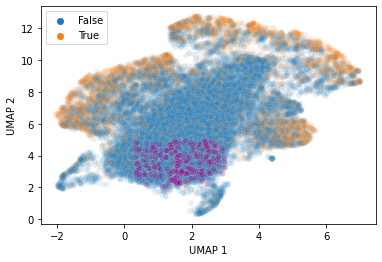

In [197]:
print(targets[cell_line])
# embeddings = df[df['cell line']==targets[cell_line]]
sns.scatterplot(data=embeddings, x='UMAP 1', y='UMAP 2', 
#                 color='grey', 
                hue='IDR',
                alpha=0.1)

l1, u1, l2, u2 = (0.3, 3, 2, 5)
selected = embed.select(embeddings,
                        lower_lim_1=l1,
                        upper_lim_1=u1, 
                        lower_lim_2=l2,
                        upper_lim_2=u2,
                        idr='y')
sns.scatterplot(data=embeddings[selected], x='UMAP 1', y='UMAP 2', color='purple', alpha=0.2)
selected_ids = np.argwhere(selected).flatten()
print(len(selected_ids))

In [25]:
# %%time
# threshold = 2
# cell_line = 2
# print(targets[cell_line])
# thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_testset(testset, cell_line, more_than=threshold)
# idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
# predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
# thresholded_Y.shape
# top_pred_ids = predictions[:,:,cell_line].max(axis=1).argsort()[::-1][:100]
# binned_cov = thresholded_Y[top_pred_ids].reshape(len(top_pred_ids), 2048//bin_size, bin_size).mean(axis=-1)
# pearsonr_values = np.array(metrics.get_correlation_per_seq(np.expand_dims(predictions[top_pred_ids, :, cell_line], axis=-1),
#                                np.expand_dims(binned_cov, axis=-1), take_avg=False)[0])
# top_pred_accurate_ids = top_pred_ids[pearsonr_values>0.9]

HepG2
CPU times: user 2min 57s, sys: 9.61 s, total: 3min 7s
Wall time: 2min 44s


(11712, 2048)

In [42]:
saliency_cell_line_dir = util.make_dir('saliency_maps/'+targets[cell_line])

In [41]:
cell_line

12

In [193]:
# top_pred_ids = predictions[:,:,cell_line].max(axis=1).argsort()[::-1][:100]
# binned_cov = thresholded_Y[top_pred_ids].reshape(len(top_pred_ids), 2048//bin_size, bin_size).mean(axis=-1)
# pearsonr_values = np.array(metrics.get_correlation_per_seq(np.expand_dims(predictions[top_pred_ids, :, cell_line], axis=-1),
#                                np.expand_dims(binned_cov, axis=-1), take_avg=False)[0])
# top_pred_accurate_ids = top_pred_ids[pearsonr_values>0.9]

saliency_maps/Panc1/left IDR.svg
saliency_maps/Panc1/right IDR.svg
saliency_maps/Panc1/top IDR.svg
saliency_maps/Panc1/mid blob IDR.svg


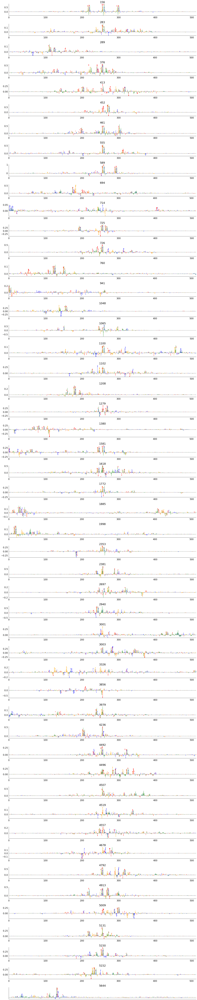

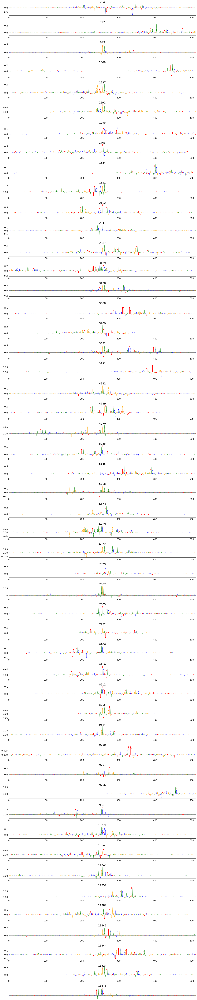

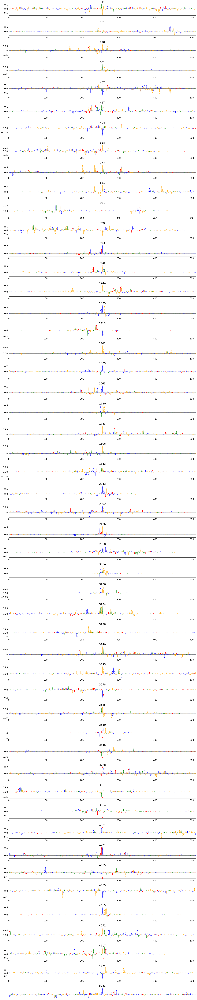

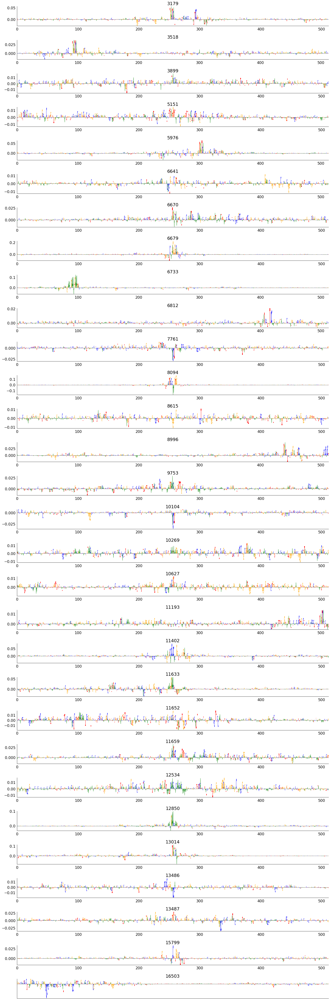

In [46]:
# sets_of_ids = {'top_pred':top_pred_accurate_ids[:50]}
sets_of_ids = {k:np.argwhere(v).flatten()[:50] for k, v  in conditions.items()}

for label,selected_sample_ids in sets_of_ids.items():
    output_path = os.path.join(saliency_cell_line_dir, label+'.svg')
    print(output_path)
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = thresholded_X[selected_sample_ids]
    saliency_scores = explainer.saliency_maps(X_sample)
    explain.plot_saliency_logos_oneplot(saliency_scores, X_sample, window=256, 
                                    titles = selected_sample_ids,
                                    filename=output_path)

In [18]:
# slice different parts of the seamonster
colorblind_pallete = ["#000000","#004949","#009292","#ffb6db", #"#ff6db6",
                     "#490092","#006ddb","#b66dff","#6db6ff","#b6dbff",
                     "#920000","#924900","#db6d00","#24ff24","#ffff6d"]

conditions = {'left IDR': embed.select(embeddings, upper_lim_1=-1, lower_lim_2=5, idr='y'),
              'right IDR': embed.select(embeddings, lower_lim_1=4, upper_lim_2=6, idr='y'),
              'top IDR': embed.select(embeddings, lower_lim_1=3, lower_lim_2=11, idr='y'),
              'center IDR': embed.select(embeddings, lower_lim_1=1, 
                                   upper_lim_1=3, lower_lim_2=5, upper_lim_2=8, idr='y')
             }

#'left non-IDR':((embeddings['UMAP 1']<-1)&(embeddings['UMAP 2']>5)&(embeddings['IDR']!=True), '#05B9F3'),
#'top non-IDR':((embeddings['UMAP 1']>4)&(embeddings['UMAP 2']<6)&(embeddings['IDR']!=True), colorblind_pallete[7]),
#'right non-IDR':((embeddings['UMAP 1']>3)&(embeddings['UMAP 2']>10)&(embeddings['IDR']!=True), colorblind_pallete[13]

# conditions[] =  ((((embeddings['UMAP 1']>0.5)&
#      (embeddings['UMAP 1']<4.8)&
#      (embeddings['UMAP 2']>5)&
#      (embeddings['UMAP 2']<8)&
#      (embeddings['UMAP 2']>7.8)&  
#      (embeddings['IDR']!=True)),'center non-IDR' , colorblind_pallete[11]))


Choosing only IDR
Choosing only IDR
Choosing only IDR
Choosing only IDR


In [19]:
# add splice labels
labels = np.array(['IDR' if e else 'non-IDR' for e in embeddings['IDR'].values])
labels = labels.astype('U25')
color_correspondance = {'non-IDR':'#B2BABB', 
                        'IDR':'#FF5733'}
for i, (l, c) in enumerate(conditions.items()):
    print(l)
    labels[c] = l
    color_correspondance[l] = colorblind_pallete[i+1]
embeddings['labels'] = labels

left IDR
right IDR
top IDR
center IDR


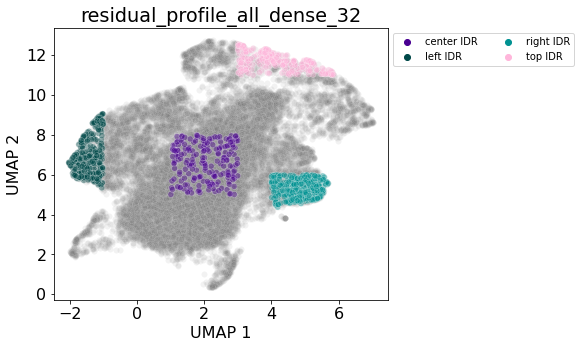

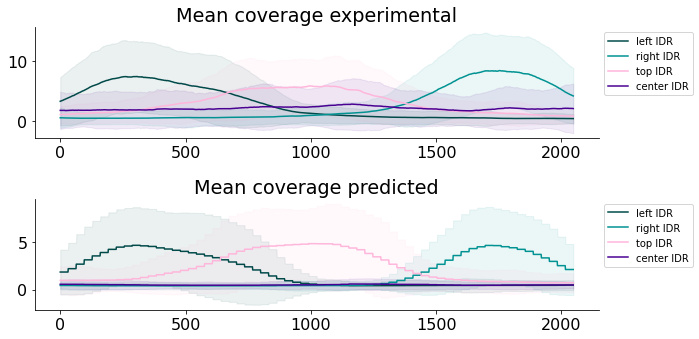

In [22]:
# plot seamosnter with slices and avg coverage
font = {'size': 16}
matplotlib.rc('font', **font)
fig, ax = plt.subplots(1,figsize=[6,5])

sns.scatterplot(data=embeddings,
               x='UMAP 1', y='UMAP 2',
               alpha=0.1, 
               color='grey',
               ax=ax)
df = embeddings.sort_values('labels')
df = df[(df['labels']!='IDR')&(df['labels']!='non-IDR')]
sns.scatterplot(data=df,
               x='UMAP 1', y='UMAP 2',
               hue='labels', alpha=0.4, 
               palette=color_correspondance,
               ax=ax)

ax.legend(loc='upper left', bbox_to_anchor=(1,1), 
                ncol=2, prop={'size': 10})
ax.set_title(embed.describe_run(run_path).split(' ')[1])
# plt.style.use('seaborn-white')
fig, axs = plt.subplots(2,1,figsize=[10,5])
data_and_labels = [(thresholded_Y[c], l, color_correspondance[l]) for l, c in conditions.items()]
plot_mean_coverages(data_and_labels, axs[0])

data_and_labels = [(np.repeat(predictions[:,:,cell_line][c], bin_size, axis=1), l, color_correspondance[l]) for l, c in conditions.items()]
plot_mean_coverages(data_and_labels, axs[1])
for i, title in enumerate(["Mean coverage experimental", 'Mean coverage predicted']):    
#     axs[i].set_ylim(0, ax.get_ylim()[1]+2)
    axs[i].legend(loc='upper left', bbox_to_anchor=(1,1), 
                  prop={'size': 10})
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].set_title(title)

plt.tight_layout()